# 0. Load parameters


In [45]:
# | tags: [parameters]
subject = "101"

In [46]:
# | tags: [parameters]
# Injected Parameters
subject = 101

In [47]:
import os
import mne
from pathlib import Path
from spectral.utils import print_date_time, read_parameters, config_project
from spectral.preproc import load_data, zapline_clean, get_bad_lof
from spectral.preproc import detrending, apply_pyprep, get_bad_channels
from spectral.viz import plot_step, plot_bad_channels
from spectral.viz import plot_epochs

import numpy as np

from spectral.ica import (
    compute_ica,
    label_components_ica,
    plot_ica_components,
    plot_removed_components,
)

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")

config = read_parameters()
my_paths = config_project(subject)

project_path = my_paths["project_path"]
raw_preproc_path = my_paths["raw_preproc_path"]
print(raw_preproc_path)
Path(raw_preproc_path).mkdir(parents=True, exist_ok=True)

figures_path = my_paths["figures_path"]

print_date_time()

/Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-101/
2024-04-23 23:21:23


This file contains preprocessing files after downsampling them.


# 1. Preprocess raw data


In [48]:


# .notch_filter(freqs=50)  # removedrifts
# print(project_path)
raw = load_data(subject, project_path=project_path).resample(250)
#raw.info["bads"] = ["VREF"]
#raw = raw

Loading data from /Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-101/ses-01/eeg/sub-101_ses-01_task-rest_eeg.set
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 16501 samples (66.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.4s


Power of components removed by DSS: 0.09
Power of components removed by DSS: 0.00
Power of components removed by DSS: 0.00
Power of components removed by DSS: 0.00
Power of components removed by DSS: 0.00
Creating RawArray with float64 data, n_channels=257, n_times=75001
    Range : 0 ... 75000 =      0.000 ...   300.000 secs
Ready.
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_69419/2473482665.py:24: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  _ = raw_zap.plot_psd(fmin=1, fmax=100, n_fft=1000, show=False)


LOF: Detected bad channel(s): ['E29', 'E31', 'E32', 'E53', 'E80', 'E91', 'E92', 'E100', 'E102', 'E104', 'E109', 'E110', 'E116', 'E120', 'E125', 'E133', 'E137', 'E145', 'E150', 'E166', 'E174', 'E187', 'E188', 'E197', 'E208', 'E216', 'E217', 'E225', 'E226', 'E227', 'E229', 'E232', 'E233', 'E234', 'E235', 'E236', 'E237', 'E238', 'E239', 'E240', 'E241', 'E242', 'E243', 'E244', 'E246', 'E247', 'E251', 'E256']
LOF: Detected bad channel(s): ['E18', 'E25', 'E37', 'E96', 'E132', 'E228', 'E230', 'E231']


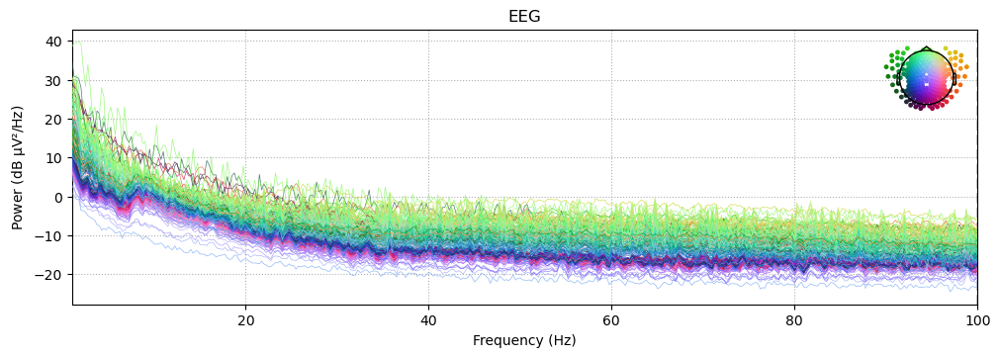

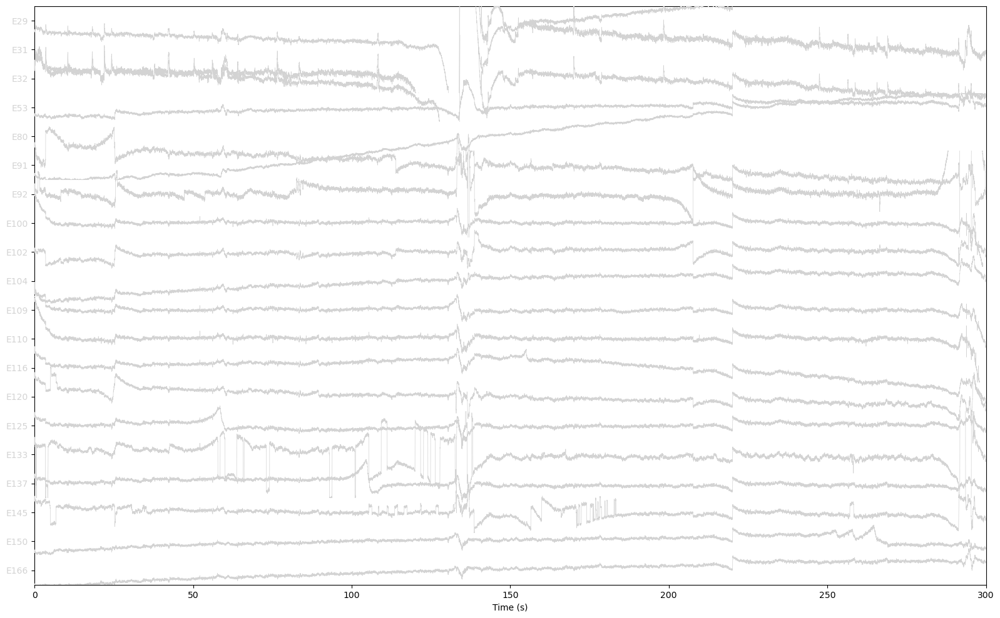

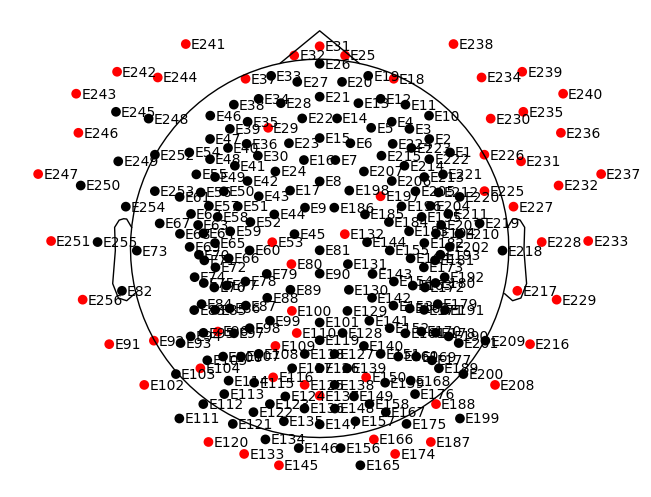

In [49]:
iter_param = {
    "nfft": 1000,
    "n_iter_max": 150,
    "win_sz": 10,
    "spot_sz": 5,
}
fline =50
filter_params = {
    "l_freq": 0.1,
    "h_freq": 100,
    "h_trans_bandwidth": "auto",
    "fir_window": "hamming",
    "fir_design": "firwin2",
    "phase": "zero",
}


raw_prefiltered = (
    raw.copy()
    .crop(tmin=0, tmax=300, include_tmax=True)
    .filter(**filter_params))
raw_zap = zapline_clean(raw_prefiltered, fline,
                        method="line",ntimes=5, iter_param=iter_param)
_ = raw_zap.plot_psd(fmin=1, fmax=100, n_fft=1000, show=False)
bad_zap = get_bad_lof(raw_zap)
raw_zap.info["bads"] = bad_zap
#_ =raw_zap.plot(picks=bad_zap,  scalings=dict(eeg=1e-4), show_scrollbars=False, show=False)
_ = plot_bad_channels( raw_zap, subject, figures_path=figures_path)

In [39]:
fline = 50
h_freq = 40
notch_freq = 50

filter_params = {
    "l_freq": 0.1,
    "h_freq": h_freq,
    "h_trans_bandwidth": "auto",
    "fir_window": "hamming",
    "fir_design": "firwin2",
    "phase": "zero",
    "picks":['ecg', 'eeg']
}


raw_filtered = (
    raw.copy()
    .crop(tmin=0, tmax=300, include_tmax=True)
    .filter(**filter_params)
        .notch_filter(
        freqs=[50.0],
        phase="zero",
        method="iir"
    )
)



Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 16501 samples (66.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.4s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

IIR filter parameters
---------------------
Butterworth bandstop zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 49.38, 50.62 Hz: -6.02, -6.02 dB



In [41]:
pyprep = True

if pyprep:
    bad_channels_by_ransac = apply_pyprep(
        raw_filtered, output="dict", as_dict=True
    )
else:
    bad_channels_by_ransac = get_bad_channels(raw_filtered)

raw_pyprep = raw_filtered.copy()
raw_pyprep.info["bads"].extend(bad_channels_by_ransac["bad_all"])

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 413 samples (3.304 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.6s


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 122
Total # of chunks: 2
Current chunk:
1
2

RANSAC done!


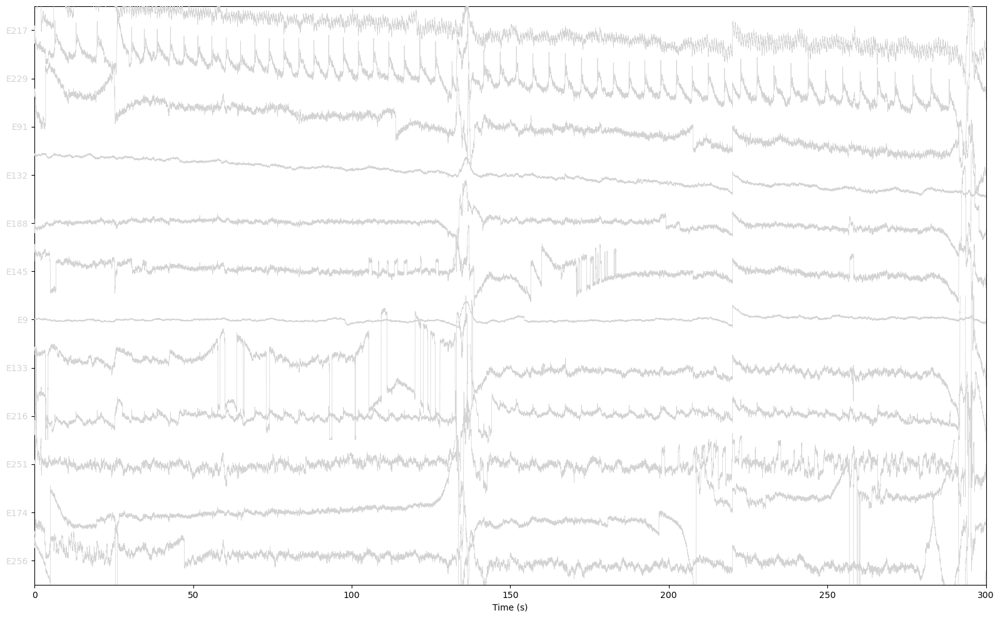

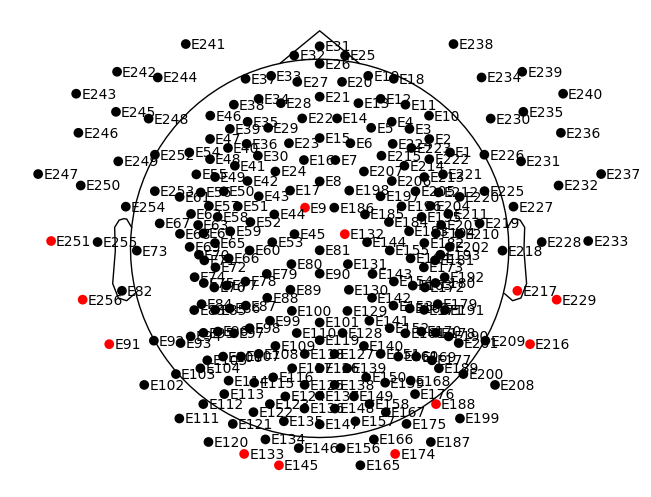

In [42]:
_ = plot_bad_channels( raw_pyprep, subject, figures_path=figures_path)

Not setting metadata
85 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 85 events and 1251 original time points ...
0 bad epochs dropped
fitting finished
Dropped 14 epochs: 0, 6, 16, 17, 36, 37, 38, 39, 40, 62, 73, 82, 83, 84


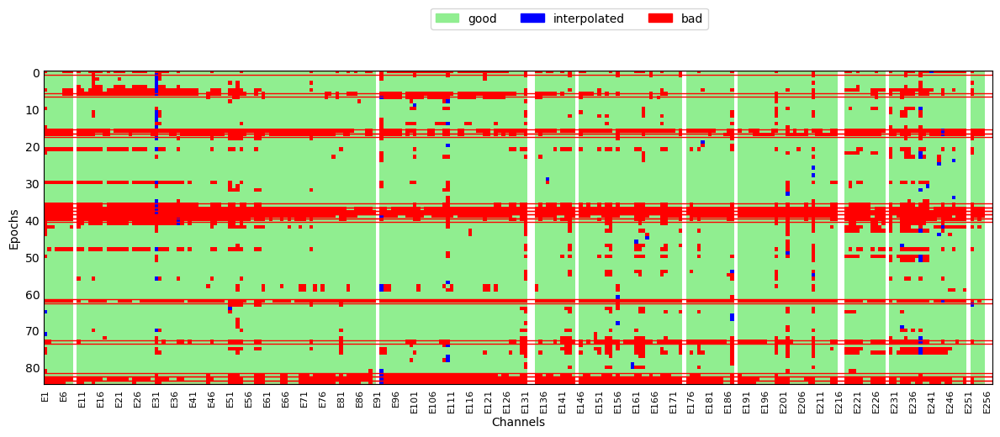

Additional 14 bad channels found:['E31', 'E53', 'E110', 'E131', 'E143', 'E154', 'E187', 'E199', 'E202', 'E209', 'E230', 'E233', 'E234', 'E238']


In [43]:
from spectral.epochs import create_epochs, get_reject_log

#raw_annotated = raw_pyprep.copy()
epochs = create_epochs(raw_pyprep, overlap=1.5)

reject_log = get_reject_log(epochs, resample=125, n_interpolate=[1], consensus=[0.35])
reject_plot = reject_log.plot("vertical")


# Drop channels with more than 40% bad epochs
BADS_THRESHOLD = 0.35

bads = np.logical_or(reject_log.labels == 1, reject_log.labels == 2)

bad_channel = bads.mean(axis=0)
# print(bad_channel)
epochs.info
channel_names = epochs.info["ch_names"]
bad_channels_by_epochs = [
    name for name, value in zip(channel_names, bad_channel) if value > BADS_THRESHOLD
]
print(
    f"Additional {len(bad_channels_by_epochs)} bad channels found:{
        bad_channels_by_epochs}"
)
epochs.info["bads"].extend(bad_channels_by_epochs)

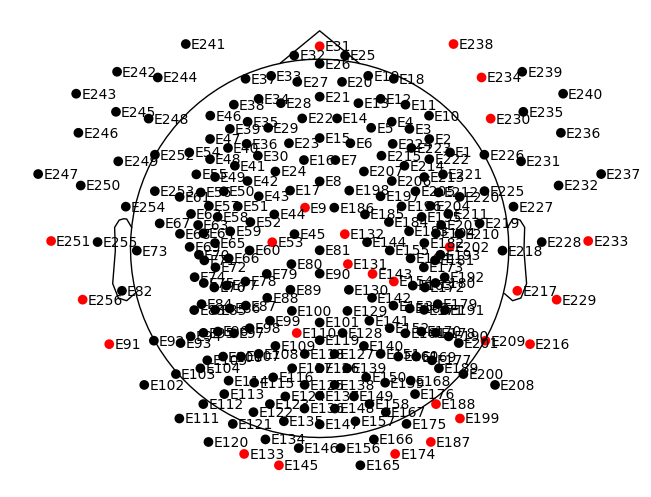

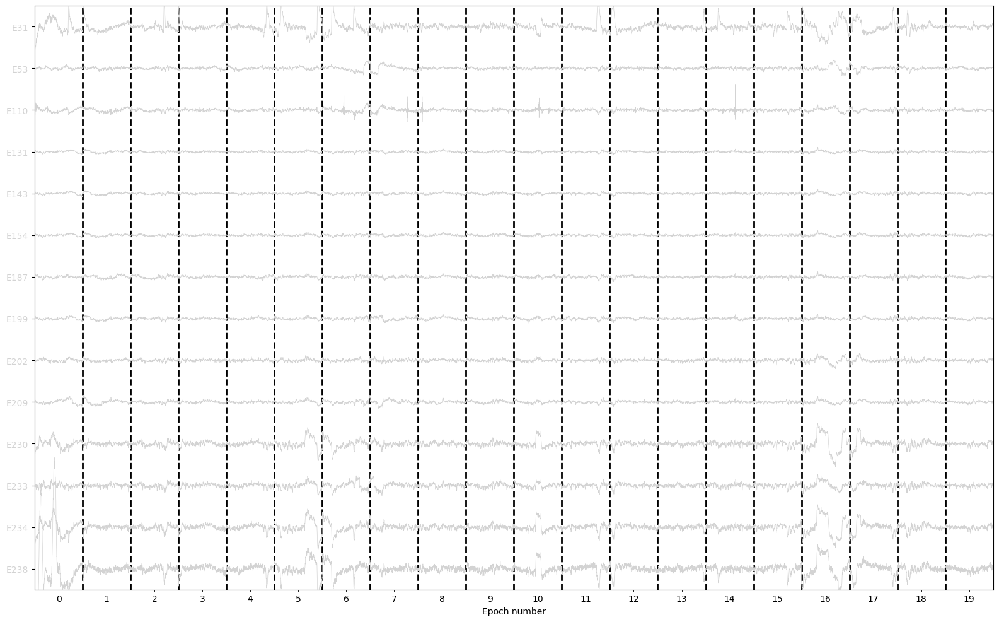

In [44]:
sensor_plot = epochs.plot_sensors(show_names=True)
bad_channel_plot = epochs.plot(
    picks= bad_channels_by_epochs,
        scalings=dict(eeg=1e-4),
        show_scrollbars=False,
    )

In [40]:
epochs_good = epochs[~reject_log.bad_epochs]
ica = compute_ica(epochs_good, n_components=0.99, method="picard")


Fitting ICA to data using 230 channels (please be patient, this may take a while)
Selecting by explained variance: 48 components
Fitting ICA took 18.1s.


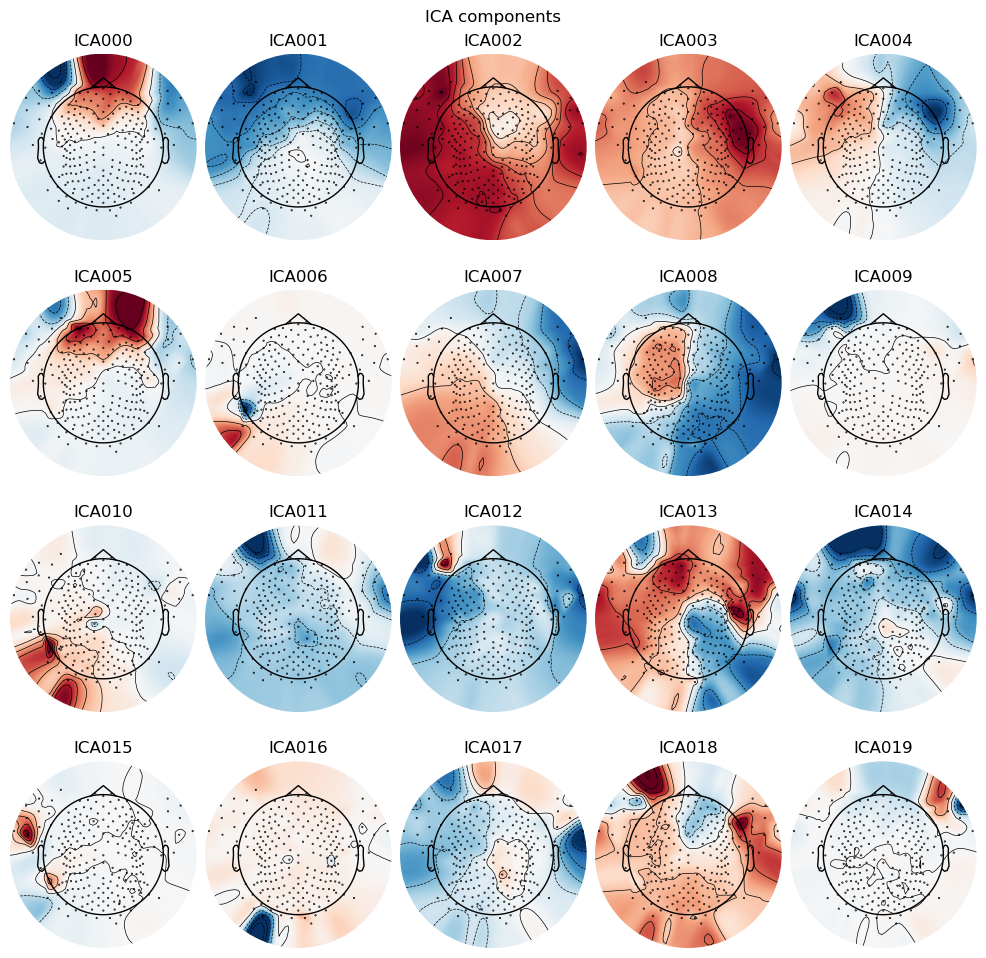

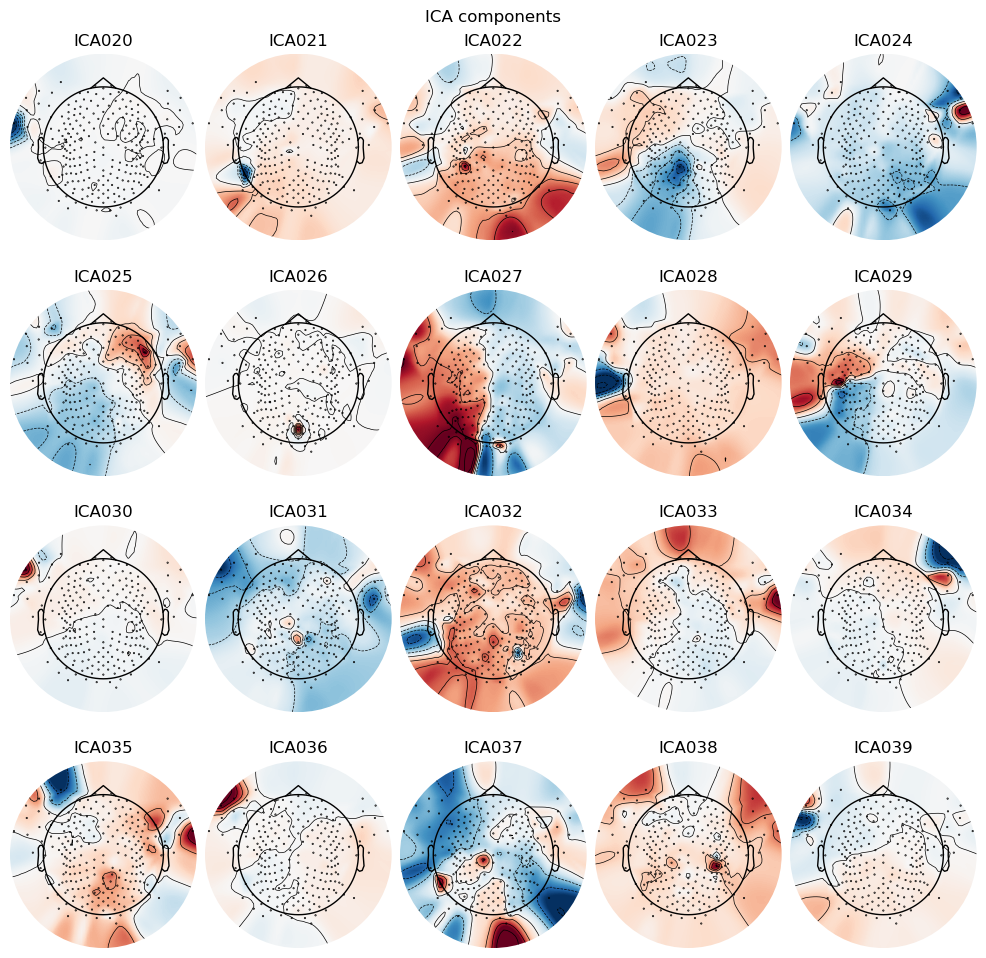

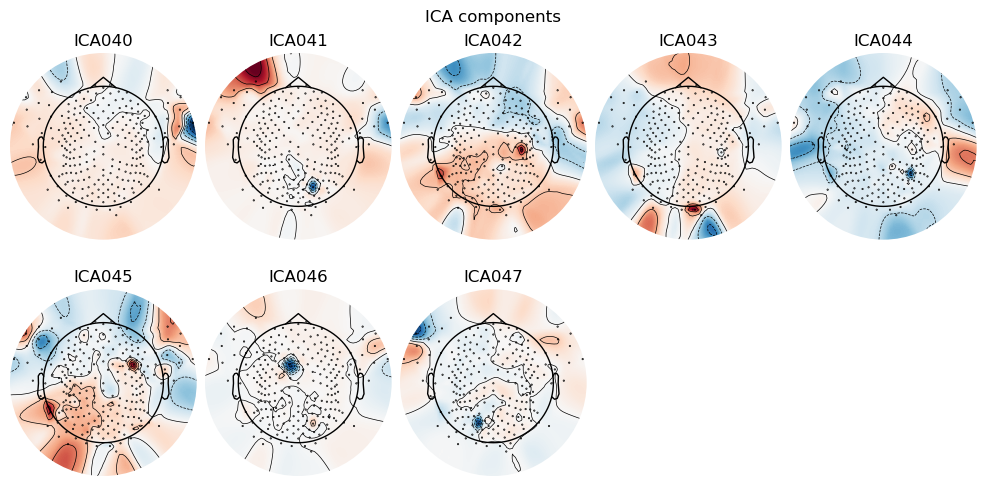

In [20]:
ica_plot_components = ica.plot_components()

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


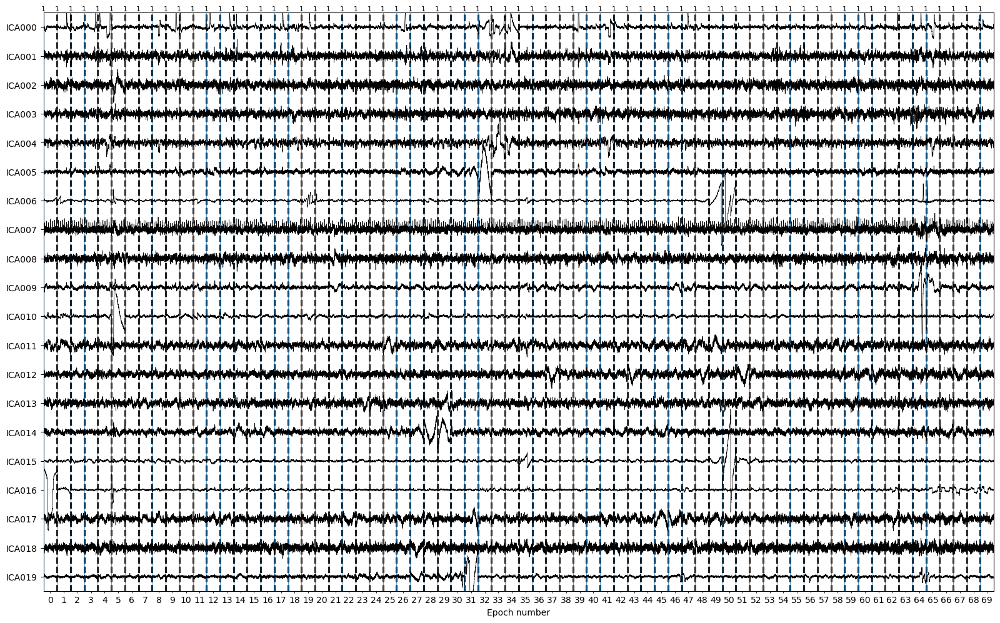

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


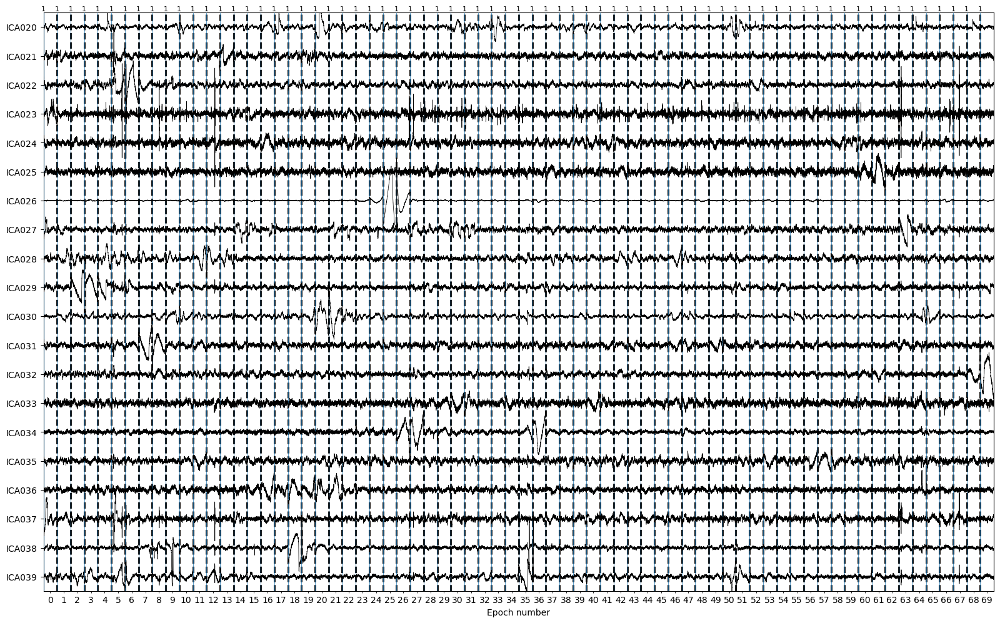

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


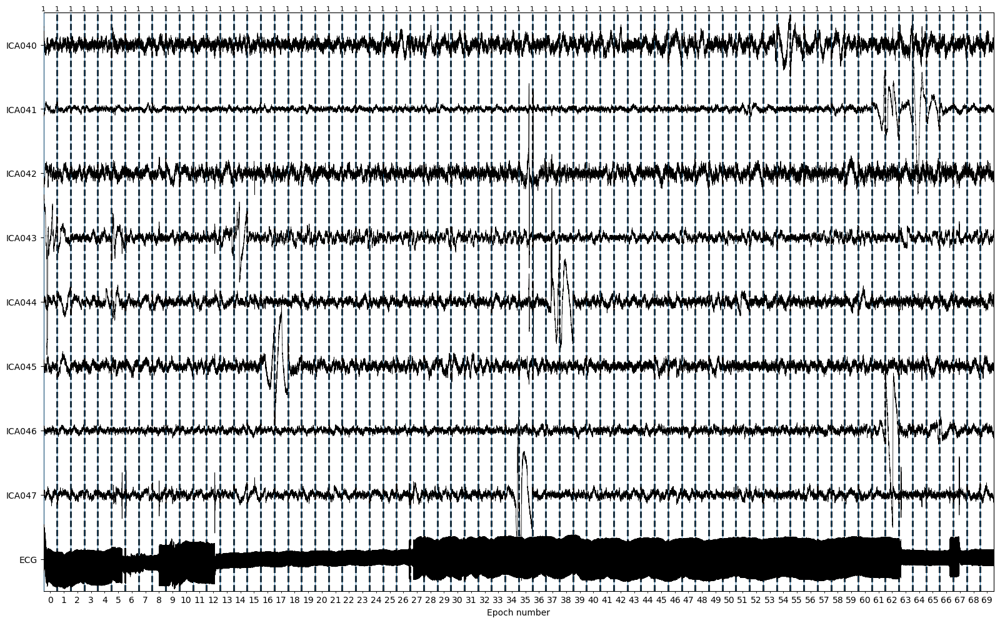

In [38]:
chunk_size = 20
chunks = [range(i, min(i + chunk_size, ica.n_components_)) for i in range(0, ica.n_components_, chunk_size)]

for chunk in chunks:
    ica_plot = ica.plot_sources(
                    epochs_good,
                    picks=chunk,
                    show_scrollbars=False,
                    start=0,
                    stop=len(epochs_good) - 1,
                )

In [ ]:
#bad_filtered  = get_bad_lof(raw_filtered )
#raw_filtered.info["bads"] = bad_filtered
#_ =raw_zap.plot(picks=bad_filtered,   scalings=dict(eeg=1e-4), show_scrollbars=False, show=False)
#_ = raw_filtered.plot_psd(fmin=1, fmax=100, n_fft=1000, show=False)
#_ = plot_bad_channels( raw_filtered, subject, figures_path=figures_path)

In [27]:



_ =raw_zap.plot(picks=bad_zap,  show=False)

In [17]:
import numpy as np
from mne import pick_types
from spectral.preproc import  get_bad_annotations
annot = get_bad_annotations(raw_marked_bad, peak_threshold=5, epoch_duration=1.0, extend_bad_duration=1.5)


0.00013553806224410794
Finding segments below or above PTP threshold.


In [18]:
#with mne.viz.use_browser_backend("qt"):
#    raw_filtered.copy().set_annotations(annot).plot()

Using qt as 2D backend.


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_36258/1599453922.py:2: RuntimeWarning: Limited 40 annotation(s) that were expanding outside the data range.
  raw_filtered.copy().set_annotations(annot).plot()
2024-04-21 22:33:44,738 - qdarkstyle - INFO - QSS file successfully loaded.
2024-04-21 22:33:44,741 - qdarkstyle - INFO - Found OS patches to be applied.
2024-04-21 22:33:44,741 - qdarkstyle - INFO - Found version patches to be applied.
2024-04-21 22:33:44,742 - qdarkstyle - INFO - Found application patches to be applied.


Using pyopengl with version 3.1.6
Using matplotlib as 2D backend.


Not setting metadata
85 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 85 events and 1251 original time points ...


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_36258/2290982678.py:3: RuntimeWarning: Limited 40 annotation(s) that were expanding outside the data range.
  raw_annotated = raw_filtered.copy().set_annotations(annot)


46 bad epochs dropped
fitting finished
Dropped 3 epochs: 14, 25, 35


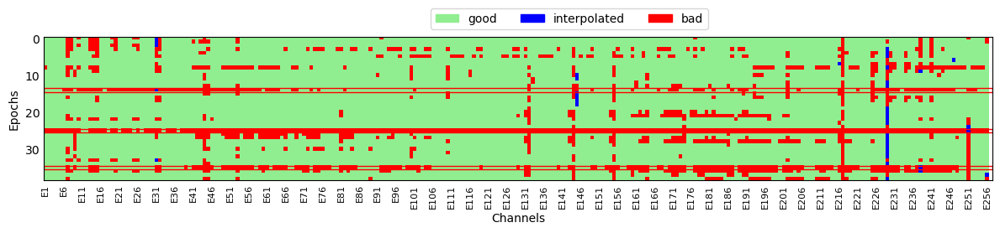

In [19]:
from spectral.epochs import create_epochs, get_reject_log

raw_annotated = raw_filtered.copy().set_annotations(annot)
epochs = create_epochs(raw_annotated, overlap=1.5)

reject_log = get_reject_log(epochs, resample=125, n_interpolate=[1], consensus=[0.4])
reject_plot = reject_log.plot("vertical")

In [14]:
# Drop channels with more than 30% bad epochs
BADS_THRESHOLD = 0.4

bads = np.logical_or(reject_log.labels == 1, reject_log.labels == 2)

bad_channel = bads.mean(axis=0)
# print(bad_channel)
epochs.info
channel_names = epochs.info["ch_names"]
bad_channels_by_epochs = [
    name for name, value in zip(channel_names, bad_channel) if value > BADS_THRESHOLD
]
print(
    f"Additional {len(bad_channels_by_epochs)} bad channels found:{
        bad_channels_by_epochs}"
)
epochs.info["bads"].extend(bad_channels_by_epochs)

Additional 13 bad channels found:['E7', 'E15', 'E31', 'E44', 'E45', 'E81', 'E144', 'E217', 'E225', 'E229', 'E238', 'E241', 'E251']


In [15]:
epochs_remove = epochs.copy().drop_channels(bad_channels_by_epochs)

bad_channels_epochs = epochs.copy().pick(bad_channels_by_epochs)
print(bad_channels_epochs)

try:
    if bad_channels_by_epochs:
        plot_epochs(
            bad_channels_epochs,
            figures_path=figures_path,
            subject=subject,
            stage="bad channels by number of rejected epochs",
            n_epochs=len(epochs[reject_log.bad_epochs]),
            n_channels=40,
        )
except Exception as e:
    print(f"Error: {e}")

<Epochs |  39 events (all good), 0 – 5 s, baseline off, ~4.9 MB, data loaded,
 '1': 39>
Error: picks (NoneNone, treated as "data") yielded no channels, consider passing picks explicitly


Fitting ICA to data using 247 channels (please be patient, this may take a while)
Selecting by explained variance: 51 components
Fitting ICA took 18.3s.


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")
/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")
/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
bad_prob_class [0, 1, 2, 3, 4, 7, 8, 9, 11, 12, 14, 15, 16, 19, 20, 22, 23, 25, 26, 28, 30, 31, 32, 36, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49]


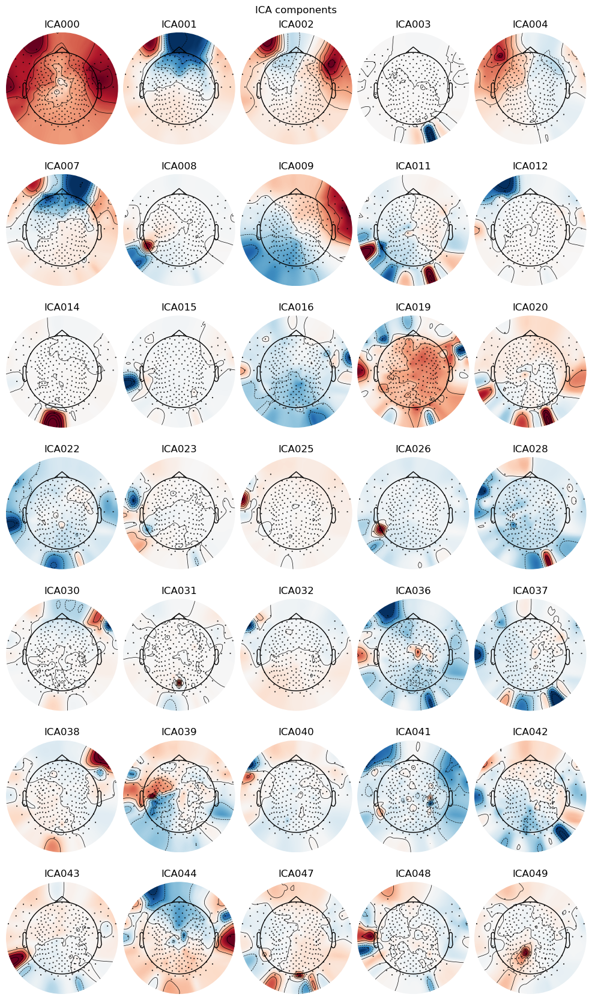

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


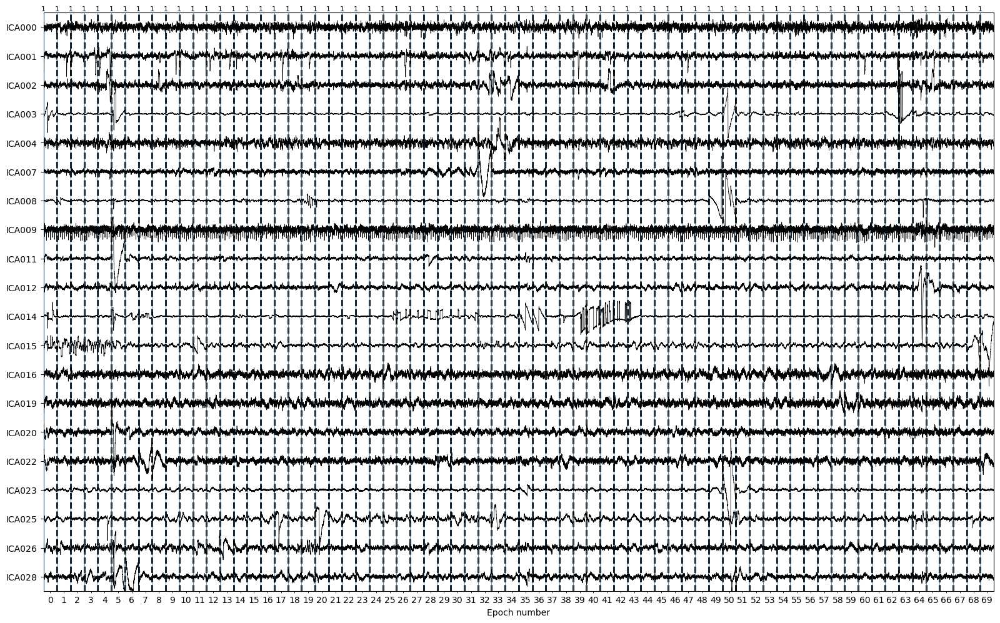

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


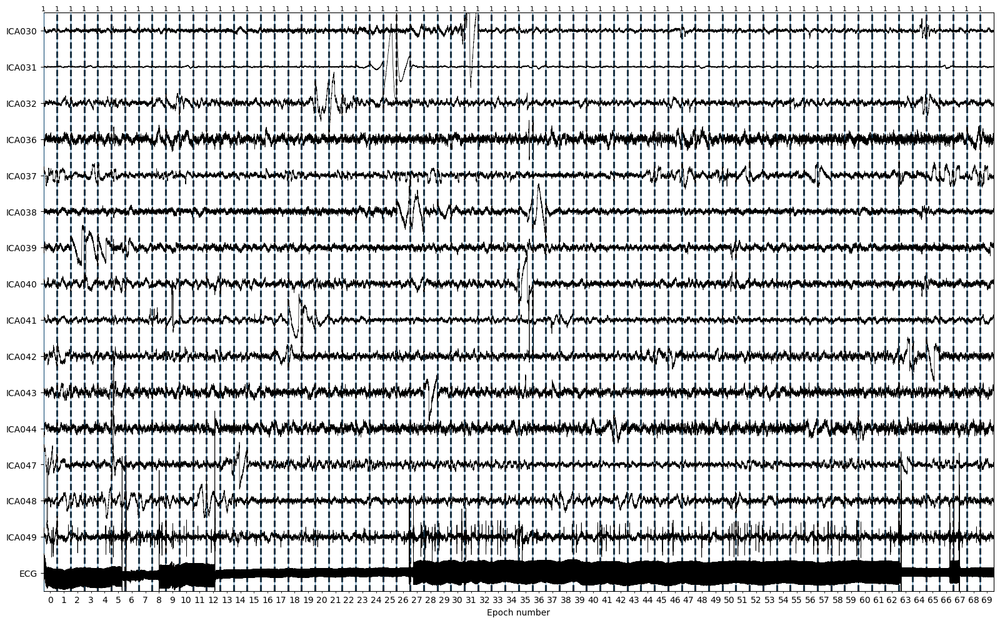

brain [5, 6]


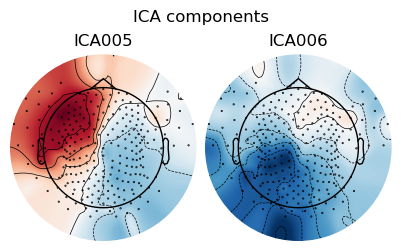

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


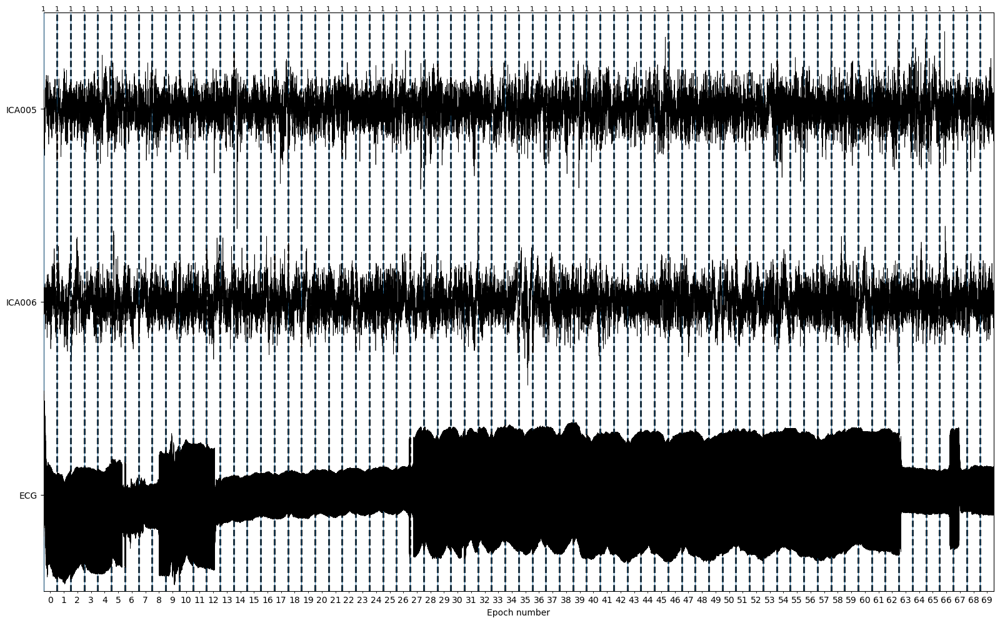

channel noise [10, 50]


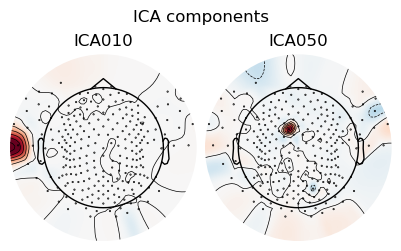

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


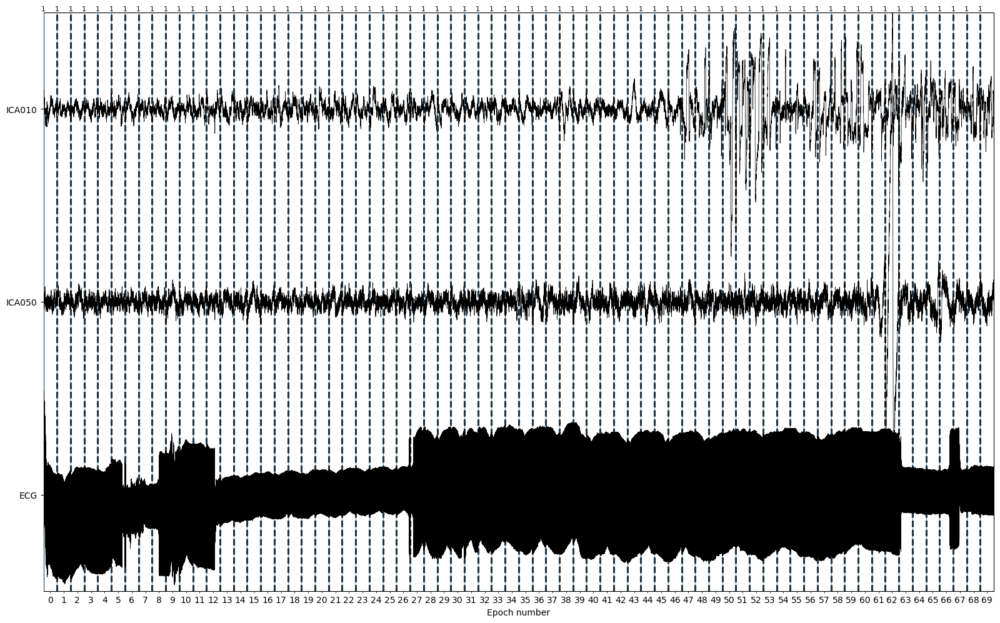

other [13, 17, 18, 21, 24, 27, 29, 33, 34, 35, 45, 46]


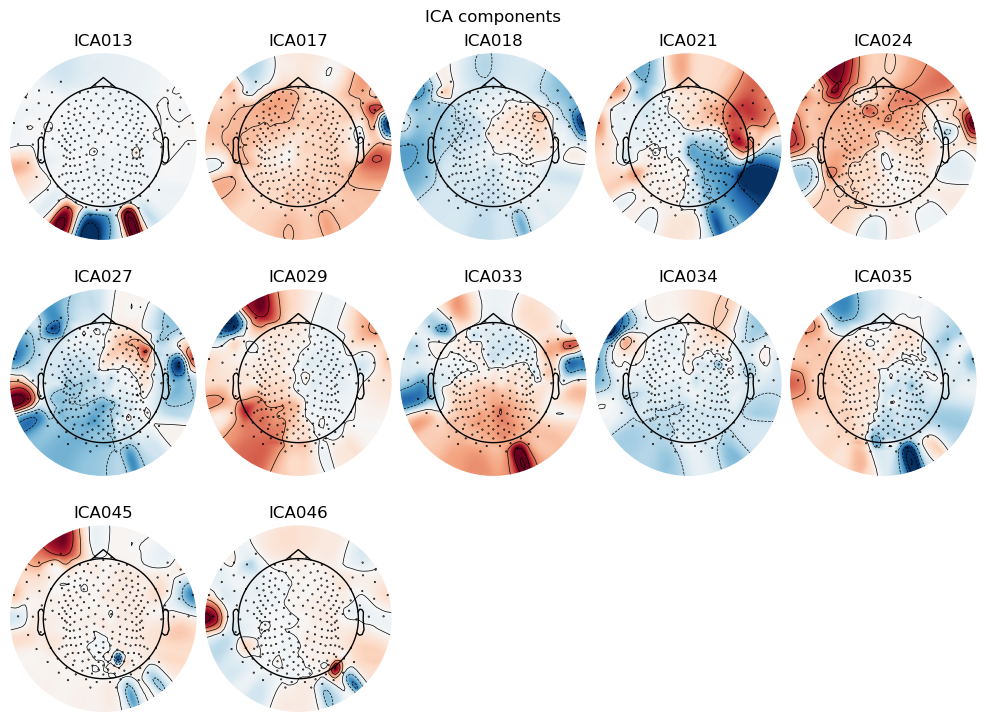

Not setting metadata
71 matching events found
No baseline correction applied
0 projection items activated


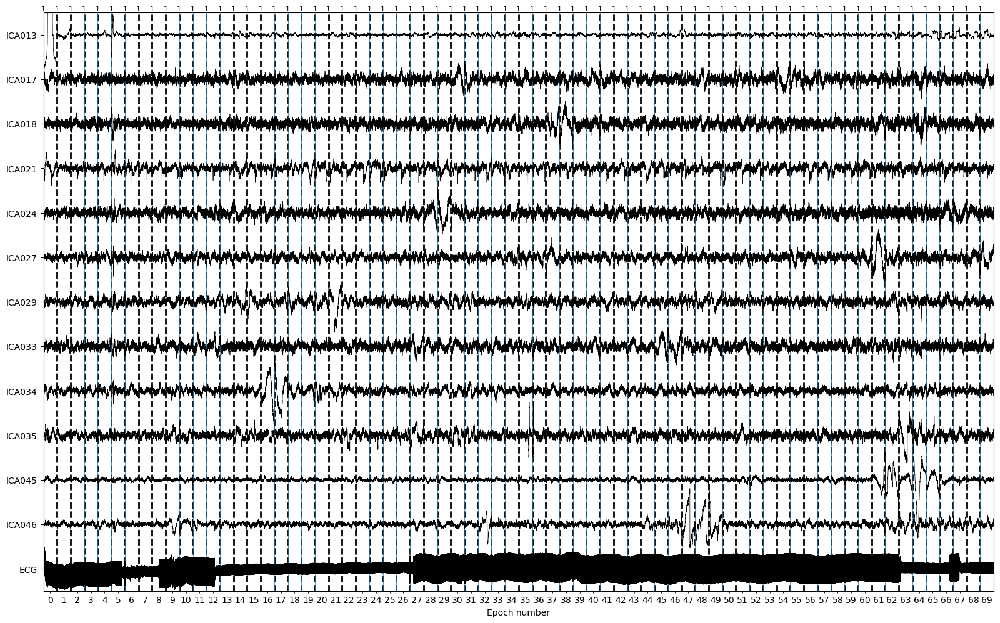

In [11]:
epochs_good = epochs[~reject_log.bad_epochs]
ica = compute_ica(epochs_good, n_components=0.99, method="picard")
labels, ic_labels = label_components_ica(epochs_good, ica)
labeled_components = plot_ica_components(
    ica,
    epochs_good,
    subject=subject,
    figures_path=figures_path,
    plot_properties=False,
)

In [44]:
ecg_indices, ecg_scores = ica.find_bads_ecg(
    raw_annotated, method="correlation", threshold="auto"
)
# ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()
if ecg_indices:
    # barplot of ICA component "EOG match" scores
    ica.plot_properties(raw_annotated, picks=ecg_indices)

    # plot ICs applied to raw data, with ECG matches highlighted
    ecg_plot = ica.plot_sources(
        raw_annotated,
        show_scrollbars=False,
        picks=ecg_indices,
        start=0,
        stop=len(epochs) - 1,
    )

Omitting 12346 of 150001 (8.23%) samples, retaining 137655 (91.77%) samples.
Omitting 12346 of 150001 (8.23%) samples, retaining 137655 (91.77%) samples.
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cuto

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


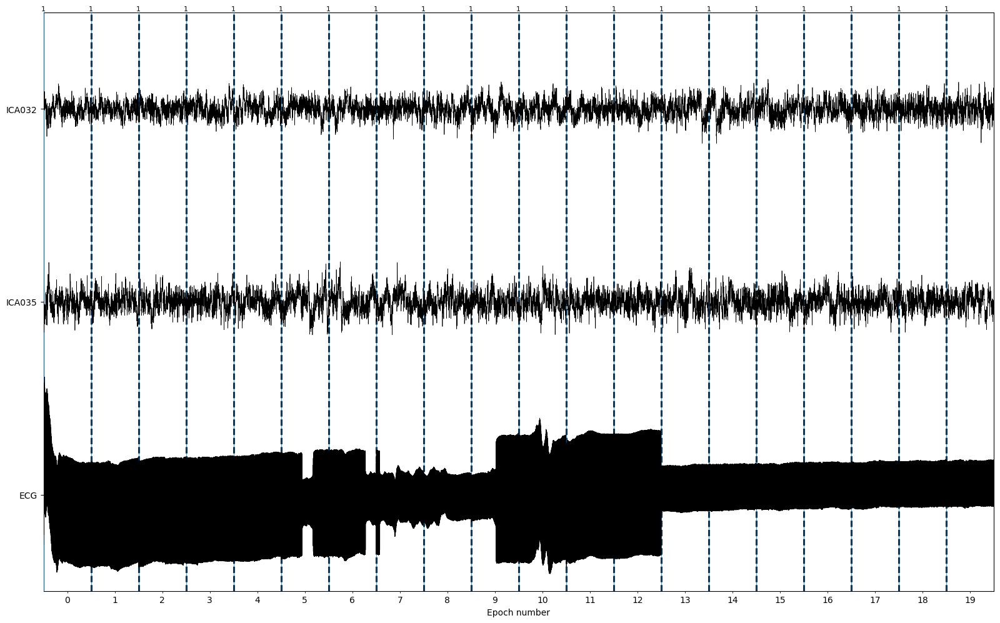

channel noise [32, 35]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


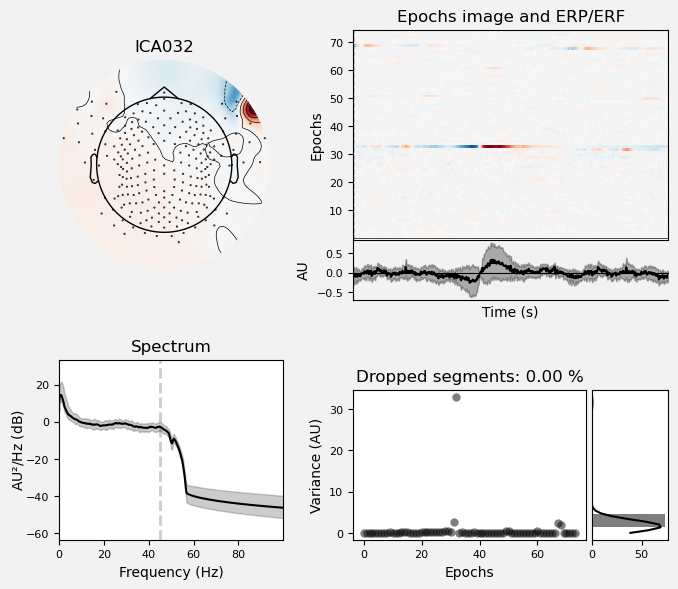

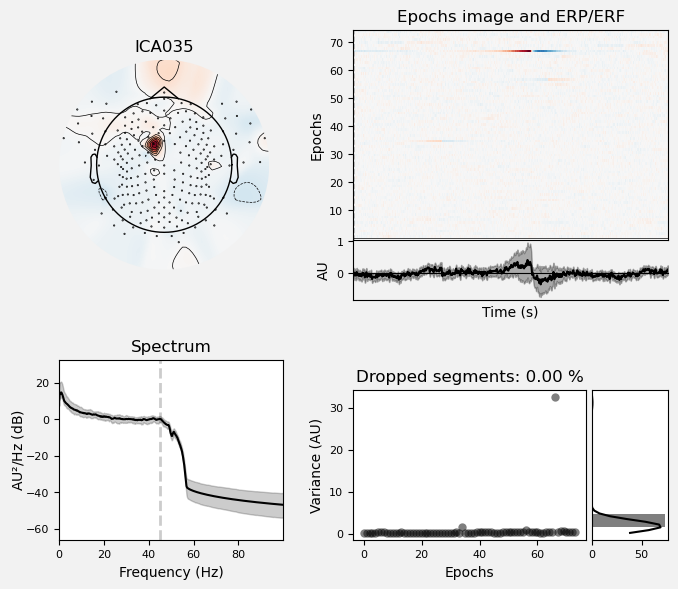

In [45]:
chosen_components = [
    "eye blink",
    "heart beat",
    "line noise",
    "muscle artifact",
    "channel noise",
]
exclude = plot_removed_components(
    ica,
    epochs,
    subject=subject,
    figure_path=figures_path,
    labeled_components=labeled_components,
    chosen_components=chosen_components,
)

Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


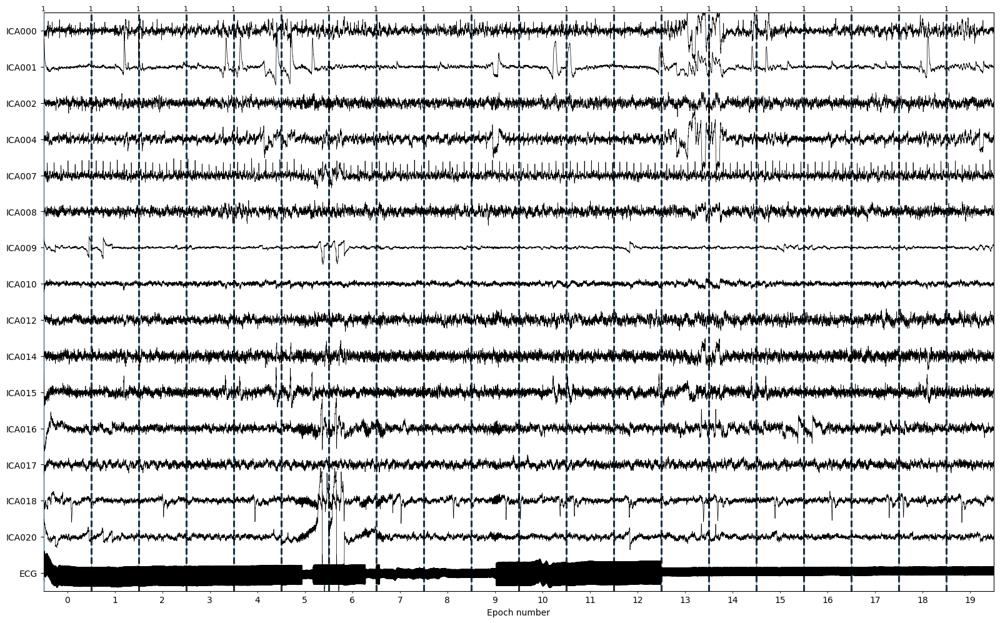

Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated


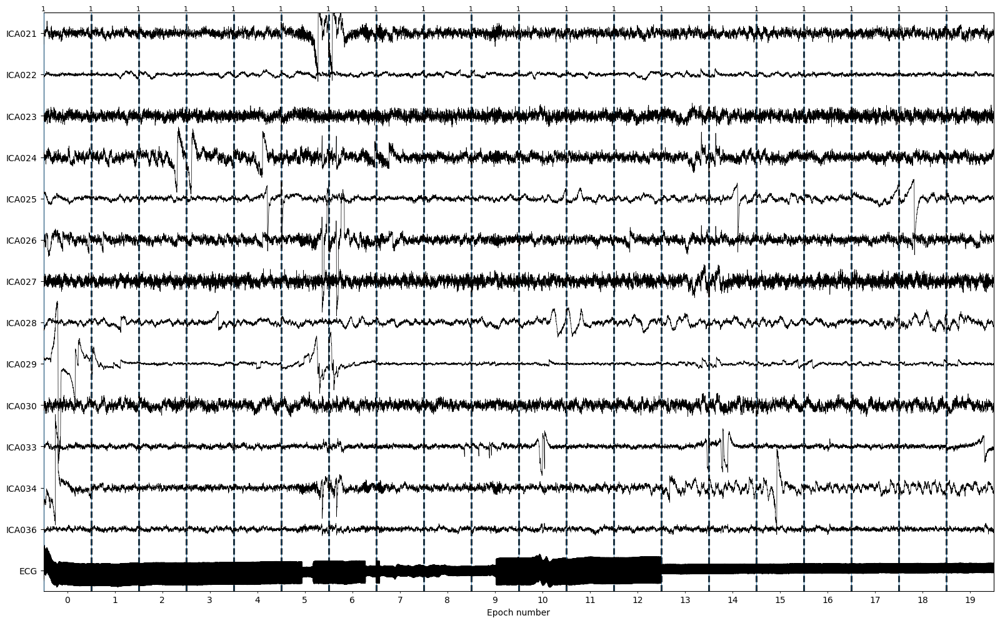

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
74 matching events found
No baseline correction applied
0 projection i

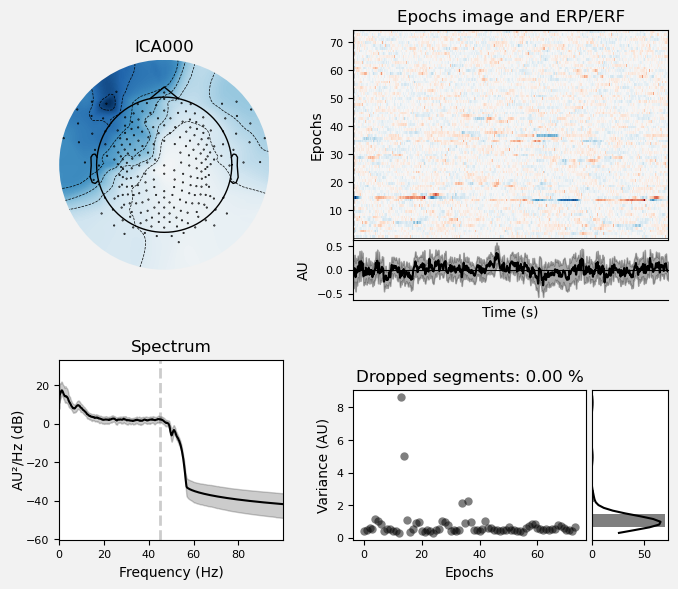

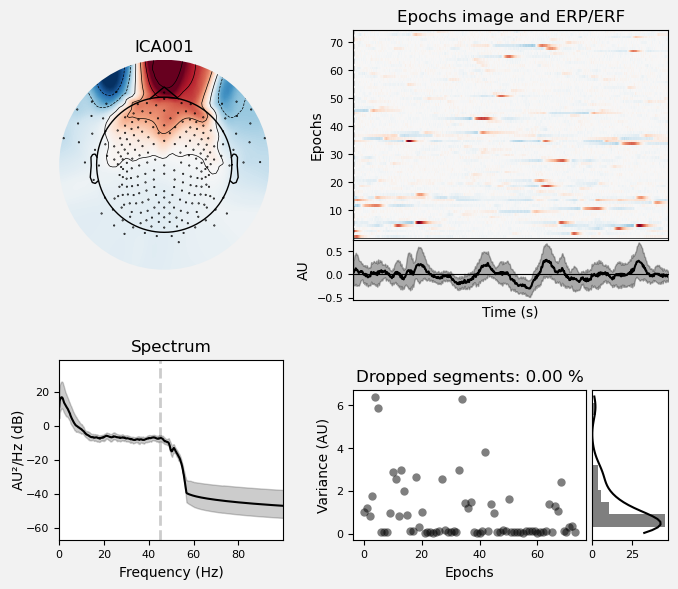

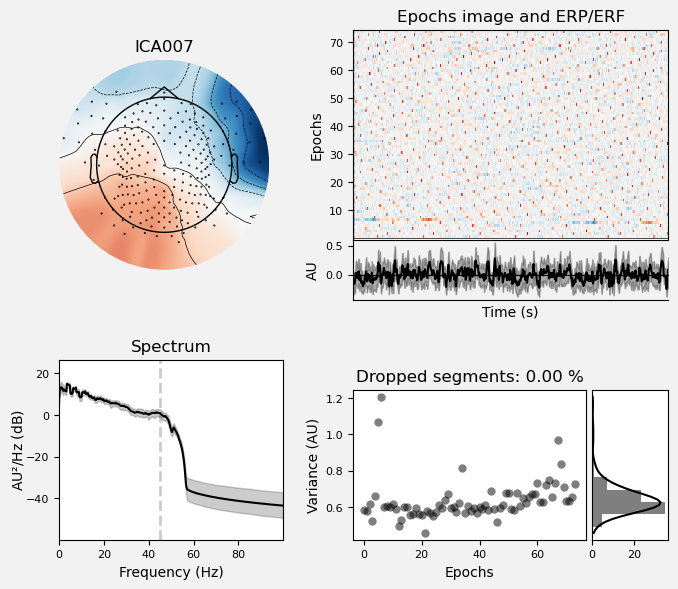

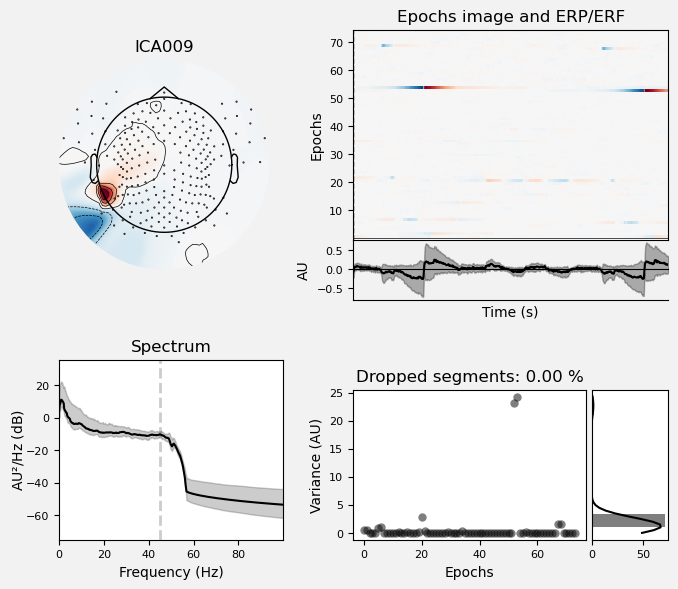

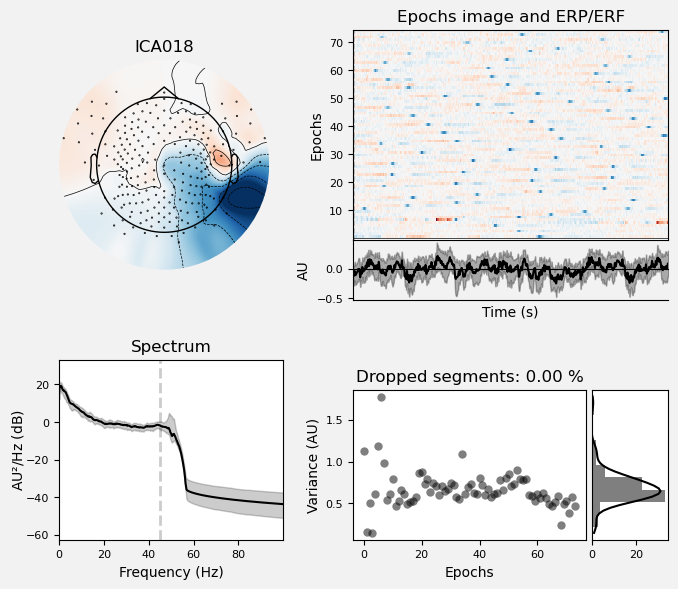

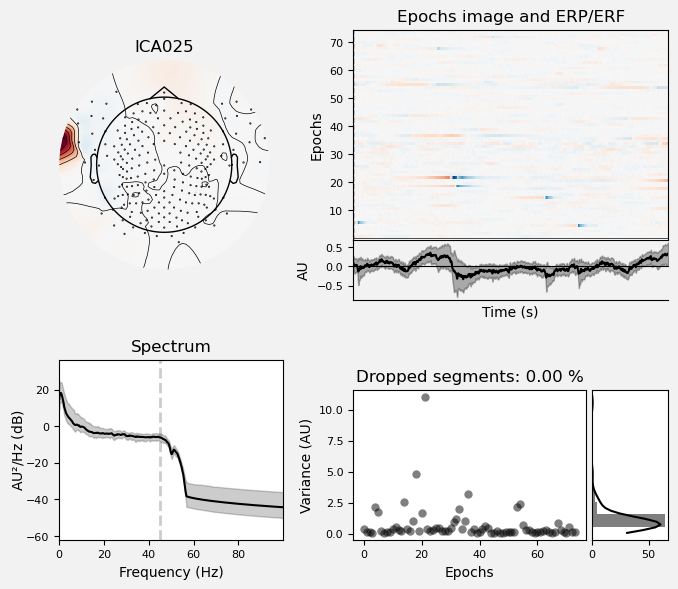

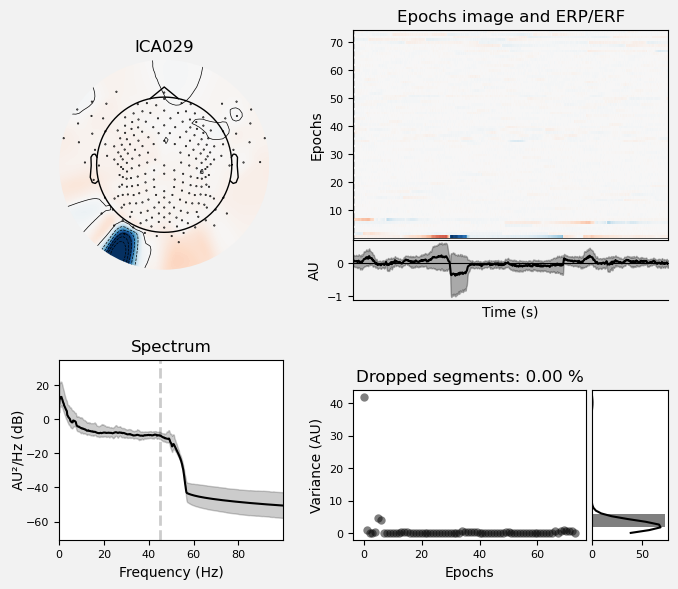

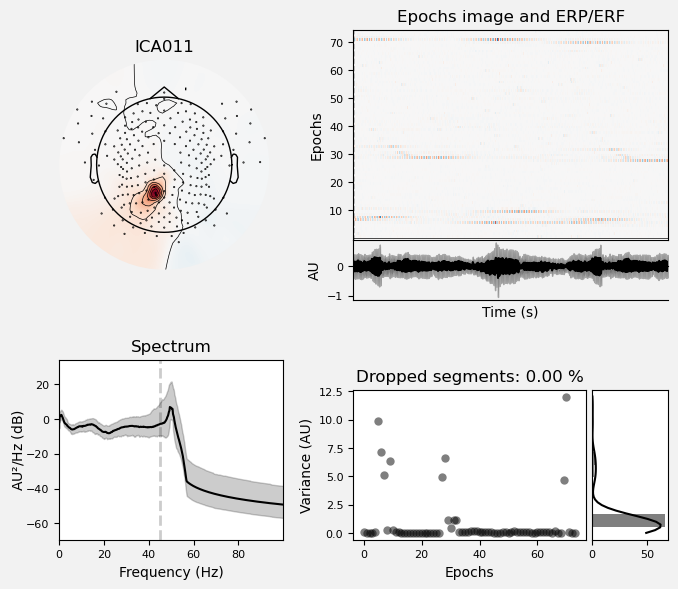

In [48]:
chunk_size = 15
indices = labeled_components["bad_prob_class"]
chunks = [indices[i: i + chunk_size]
          for i in range(0, len(indices), chunk_size)]
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs,
        show_scrollbars=False,
        picks=chunk,
        start=0,
        stop=20,
    )
# [1, 19, 36] template should not have manual excluded be used
manual_exclude = [0, 1, 7, 9, 18, 25, 29, 11]  # [1, 2, 3, 12, 20, 28]
if manual_exclude:
    figs = ica.plot_properties(
        epochs, picks=manual_exclude, psd_args={"fmax": 100.0})

Applying ICA to Epochs instance
    Transforming to ICA space (37 components)
    Zeroing out 10 ICA components
    Projecting back using 239 PCA components
No projector specified for this dataset. Please consider the method self.add_proj.


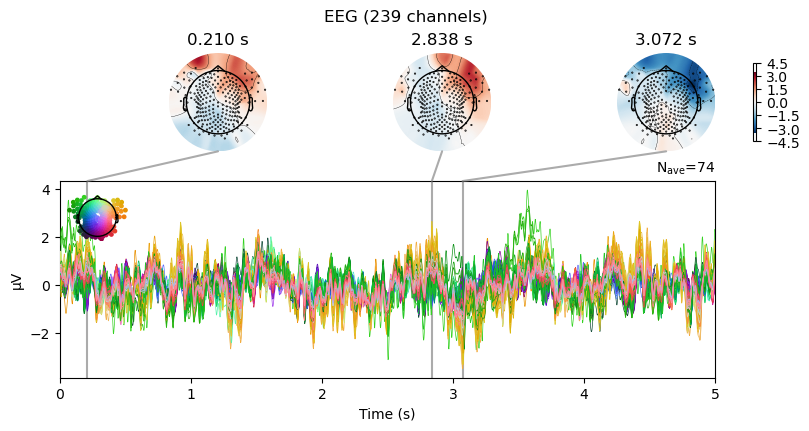

Effective window size : 4.096 (s)
Averaging across epochs...


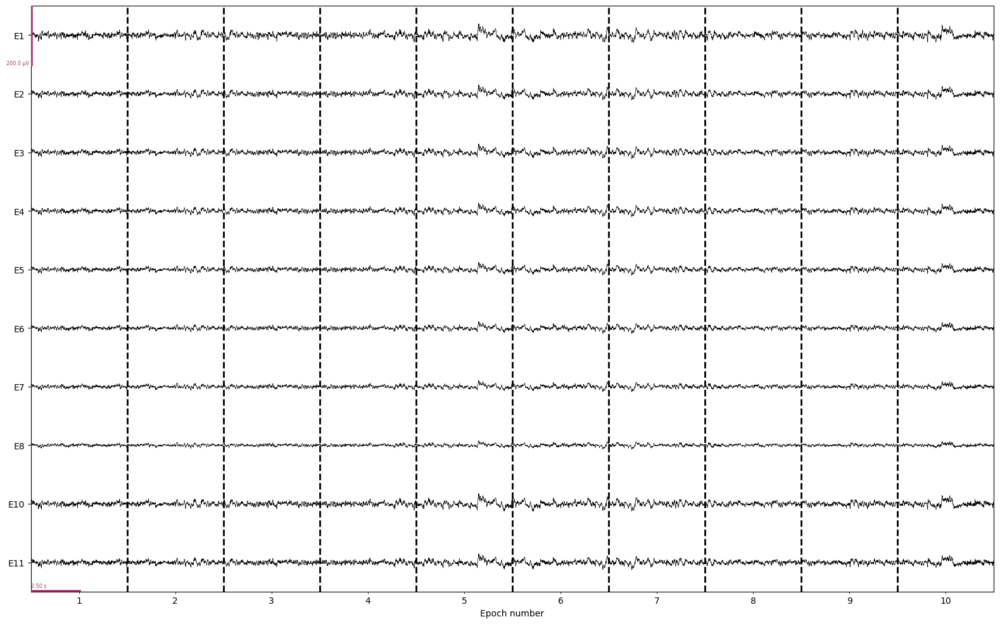

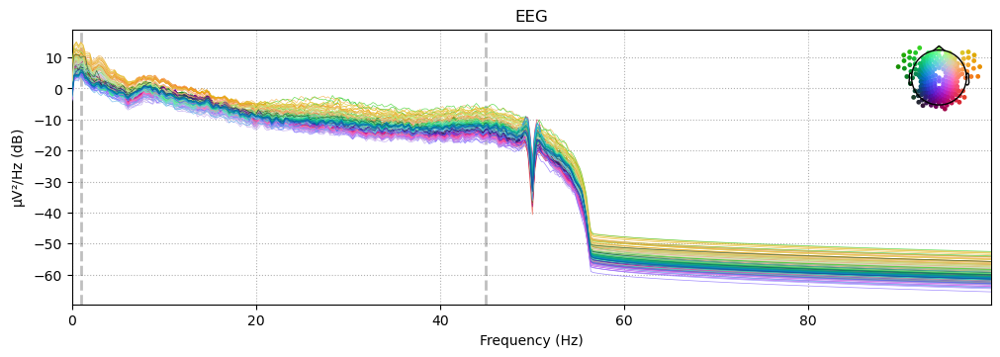

In [49]:
ica.exclude = exclude + ecg_indices + manual_exclude
epochs_clean = ica.apply(epochs.copy(), exclude=ica.exclude)
# epochs_clean.save(
#    f"{epochs_preproc_path}/sub-{subject}_clean_ica-epo_automated-epo.fif",
#    overwrite=True,
# )
epochs_clean_plot = plot_epochs(
    epochs_clean,
    figures_path=figures_path,
    subject=subject,
    stage="epochs_after_automatic_ICA",
)

In [15]:
from scipy import stats


def zscore(data):
    """Z-score data by subtracting the mean and dividing by the standard deviation."""
    mean = np.mean(data, axis=1, keepdims=True)
    std = np.std(data, axis=1, keepdims=True)
    return (data - mean) / std


data = raw_filtered.get_data(picks=picks)
ptp = np.ptp(data, axis=-1)  # Peak-to-peak amplitude for each channel
peak = 2.5 * np.median(ptp)

print(peak)

0.000618722484965166


In [34]:
with mne.viz.use_browser_backend("qt"):
    raw_filtered.plot(
        start=0,
        duration=60,
        n_channels=32,
        scalings=dict(eeg=100e-6),
    )

Using qt as 2D backend.


2024-03-28 23:33:35,530 - qdarkstyle - INFO - QSS file successfully loaded.
2024-03-28 23:33:35,530 - qdarkstyle - INFO - Found OS patches to be applied.
2024-03-28 23:33:35,530 - qdarkstyle - INFO - Found version patches to be applied.
2024-03-28 23:33:35,531 - qdarkstyle - INFO - Found application patches to be applied.


Using pyopengl with version 3.1.6
Using matplotlib as 2D backend.


Finding segments below or above PTP threshold.


<Annotations | 0 segments>

In [7]:
bad_channels_by_ransac

['E9', 'E217', 'E229']

Power of components removed by DSS: 0.00


Iteration 0 score: 2.2602348452851056e-12


Power of components removed by DSS: 0.00


Iteration 1 score: -6.459480158490818e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -8.59426922439839e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -9.26313660170616e-13


Power of components removed by DSS: 0.00


Iteration 0 score: -9.523092418466723e-13
Creating RawArray with float64 data, n_channels=258, n_times=149001


    Range : 0 ... 149000 =      0.000 ...   298.000 secs


Ready.


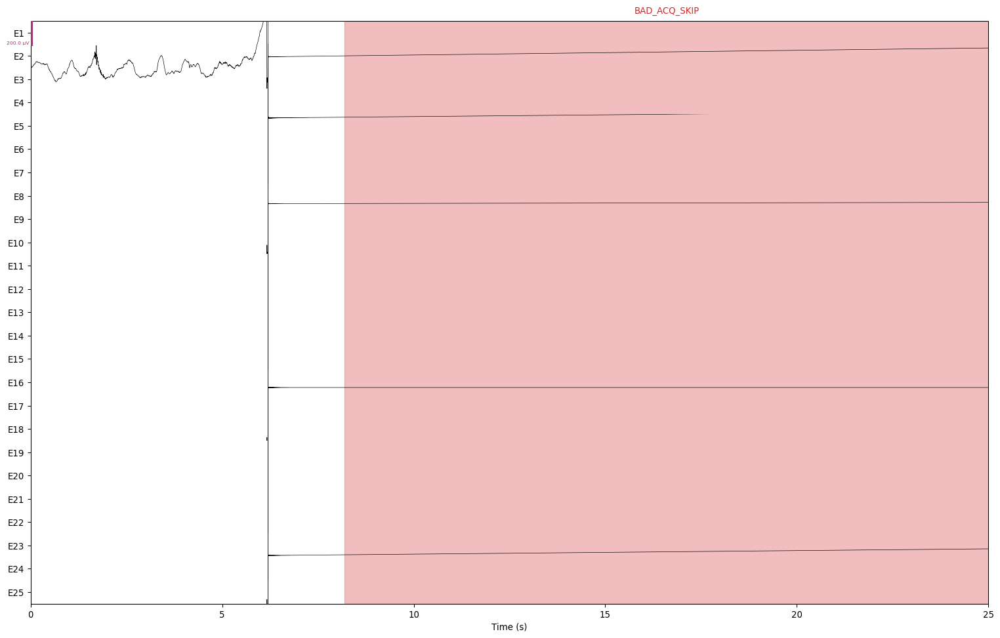

Setting 11317 of 149001 (7.60%) samples to NaN, retaining 137684 (92.40%) samples.


Effective window size : 4.096 (s)


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/viz.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


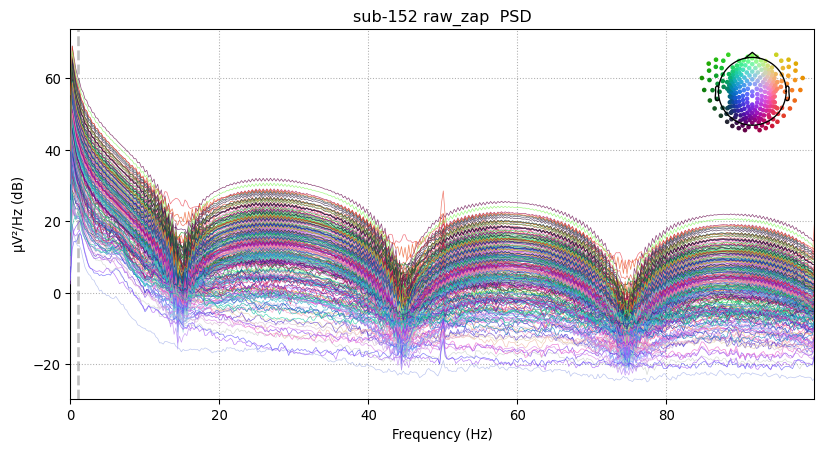

In [5]:
iter_param = {
    "nfft": 500,
    "n_iter_max": 200,
    "win_sz": 12.5,
    "spot_sz": 6,
}
raw_zap = zapline_clean(raw_filtered, fline, method="iter", iter_param=iter_param)

plot_step(
    raw_zap,
    subject,
    figures_path,
    stage="raw_zap ",
    duration=25.0,
    n_channels=25,
    fmax=h_freq,
)

In [6]:
pyprep = True

if pyprep:
    bad_channels_by_ransac = apply_pyprep(raw_zap)
else:
    bad_channels_by_ransac = get_bad_channels(raw_zap)

raw_zap.info["bads"].extend(bad_channels_by_ransac)
raw_zap.save(f"{raw_preproc_path}/sub-{subject}_filtered_zap_eeg.fif", overwrite=True)
raw_zap.info

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


Setting up high-pass filter at 1 Hz


FIR filter parameters


---------------------


Designing a one-pass, zero-phase, non-causal highpass filter:


- Windowed time-domain design (firwin) method


- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation


- Lower passband edge: 1.00


- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)


- Filter length: 413 samples (3.304 s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s


Executing RANSAC
This may take a while, so be patient...


Finding optimal chunk size : 243


Total # of chunks: 1


Current chunk:


1



RANSAC done!


Found 17 uniquely bad channels:

0 by NaN: []

0 by flat: []

2 by deviation: ['E10', 'E216']

2 by HF noise: ['E186', 'E209']

12 by correlation: ['E68', 'E91', 'E101', 'E146', 'E154', 'E186', 'E187', 'E188', 'E199', 'E201', 'E209', 'E216']

2 by SNR: ['E209', 'E186']

0 by dropout: []

4 by RANSAC: ['E9', 'E52', 'E208', 'E254']



bad all ['E146', 'E52', 'E186', 'E199', 'E188', 'E254', 'E68', 'E154', 'E216', 'E101', 'E208', 'E91', 'E201', 'E10', 'E9', 'E209', 'E187']
Writing /Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-152/sub-152_filtered_zap_eeg.fif


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_65482/3123248222.py:9: RuntimeWarning: Acquisition skips detected but did not fit evenly into output buffer_size, will be written as zeroes.
  raw_zap.save(


Closing /Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-152/sub-152_filtered_zap_eeg.fif


[done]


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,260 points
Good channels,"239 EEG, 1 ECG"
Bad channels,"VREF, E146, E52, E186, E199, E188, E254, E68, E154, E216, E101, E208, E91, E201, E10, E9, E209, E187"
EOG channels,Not available
ECG channels,ECG
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,100.00 Hz


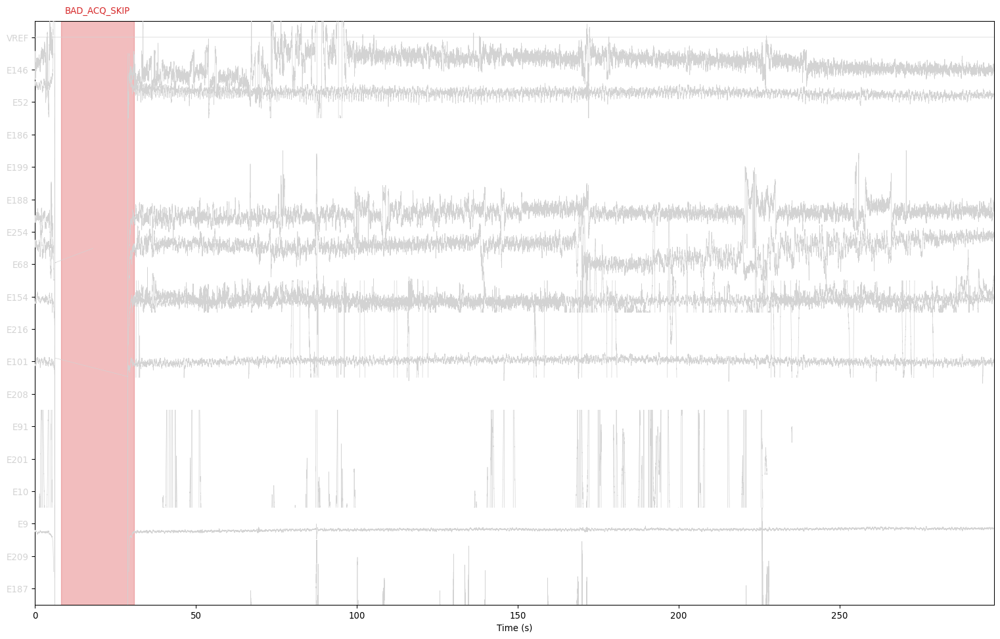

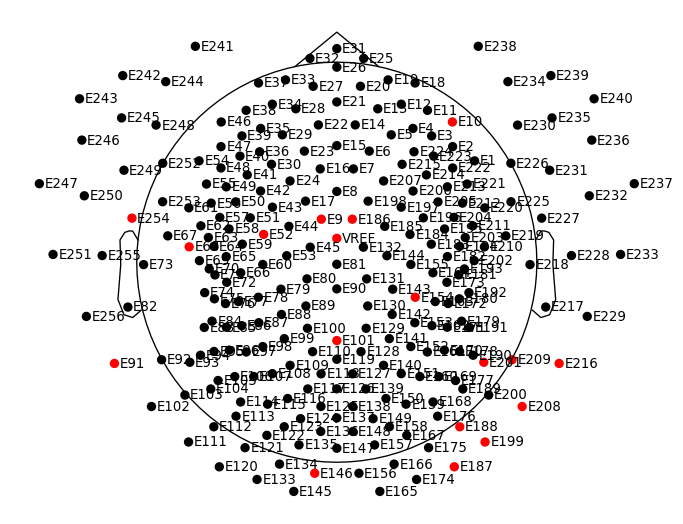

In [7]:
_ = plot_bad_channels(raw_zap, subject, figures_path=figures_path)

In [8]:
print(
    f"{subject} -  identified {len(raw_zap.info['bads'])
                               }  bad channels: {raw_zap.info['bads']}"
)
print_date_time()

152 -  identified 18  bad channels: ['VREF', 'E146', 'E52', 'E186', 'E199', 'E188', 'E254', 'E68', 'E154', 'E216', 'E101', 'E208', 'E91', 'E201', 'E10', 'E9', 'E209', 'E187']
2024-03-25 12:36:07
